<a href="https://colab.research.google.com/github/Aaarin12/Pheno12/blob/main/Decoding_flora_of_Bengal_India.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi


Sun Mar 23 21:19:46 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.1/235.7 GB disk)


In [5]:
from ultralytics import YOLO
from IPython.display import display, Image

In [7]:
!pip install roboflow


In [8]:
from roboflow import Roboflow
rf = Roboflow(api_key="EwfHIT9w5sdIPsyyFO5v")
project = rf.workspace("image-analysis-0mduj").project("decoding-flora-of-bengal")
version = project.version(1)
dataset = version.download("yolov12")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Decoding-Flora-of-Bengal-1 in yolov12:: 100%|██████████| 744/744 [00:00<00:00, 5424.46it/s]


In [9]:
dataset.location

'/content/Decoding-Flora-of-Bengal-1'

In [11]:
! yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo12s.pt" epochs=60 imgsz=800

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo12s.pt, data=/content/Decoding-Flora-of-Bengal-1/data.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_c

In [12]:
from IPython.display import display, Image

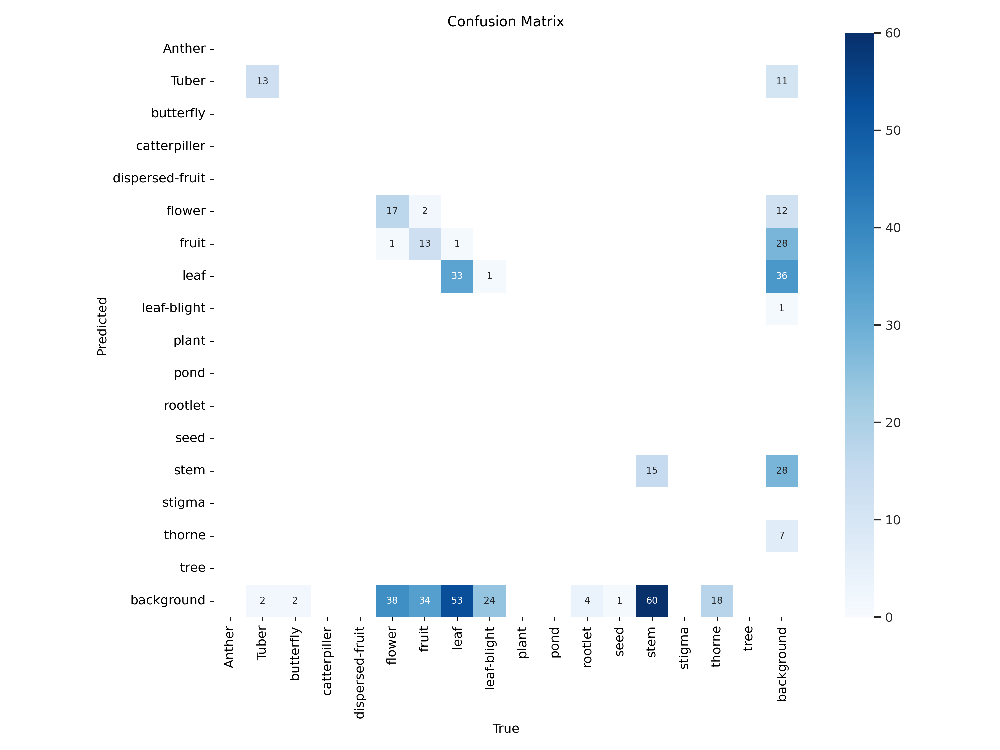

In [13]:
Image ("/content/runs/detect/train2/confusion_matrix.png", width= 900)

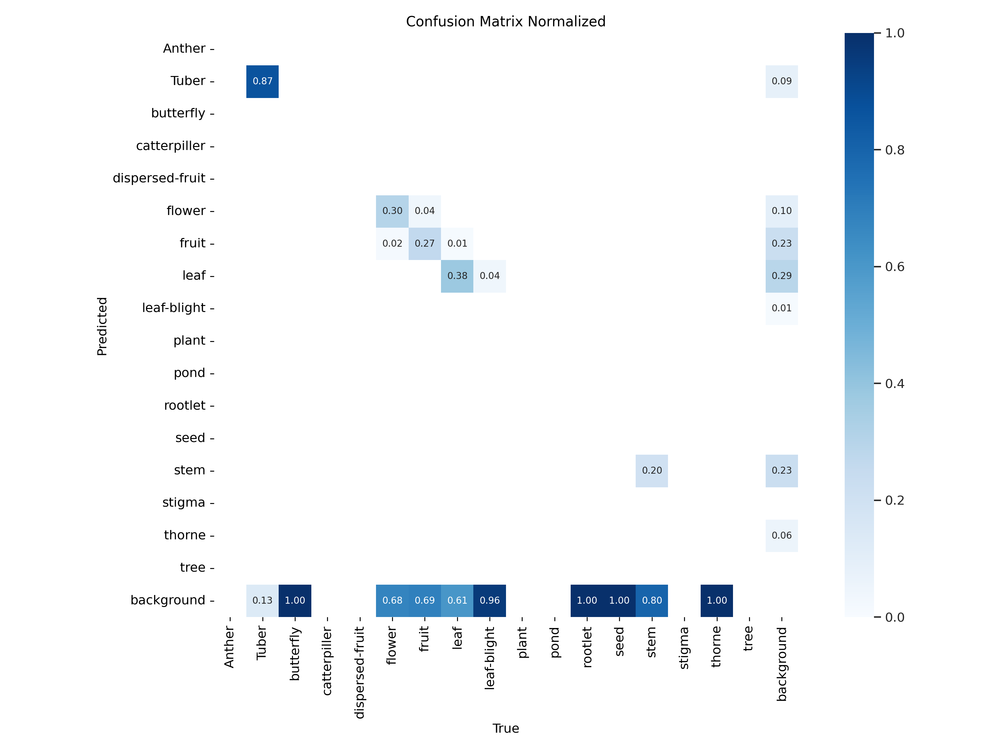

In [14]:
Image ("/content/runs/detect/train2/confusion_matrix_normalized.png", width= 900)

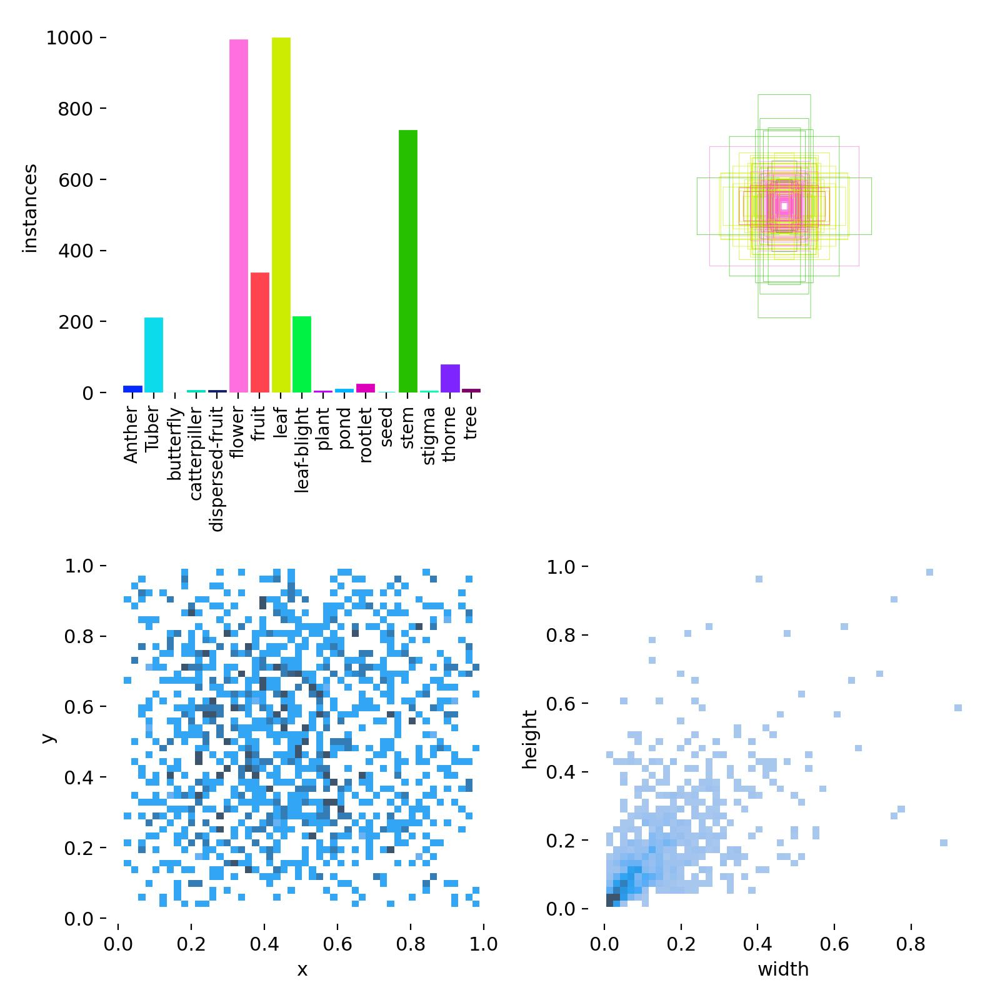

In [15]:
Image ("/content/runs/detect/train2/labels.jpg", width= 900)

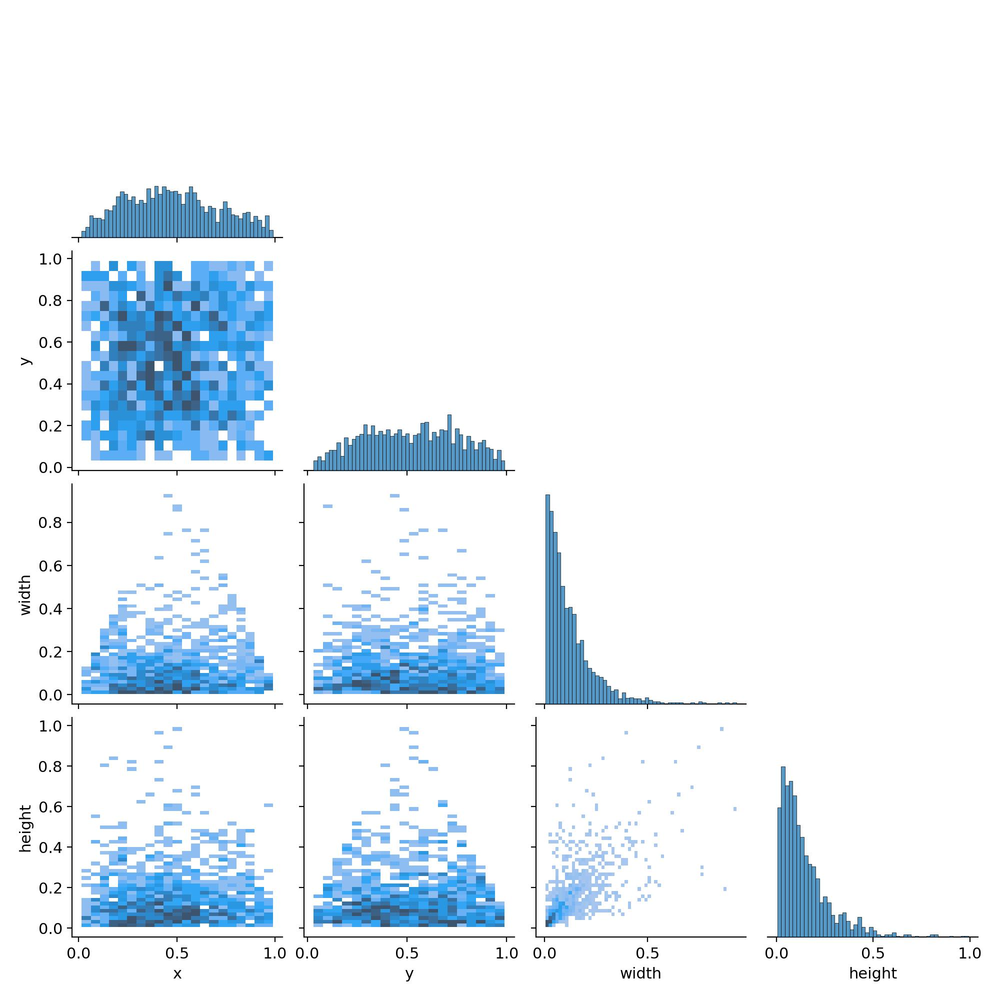

In [16]:
Image ("/content/runs/detect/train2/labels_correlogram.jpg", width= 900)

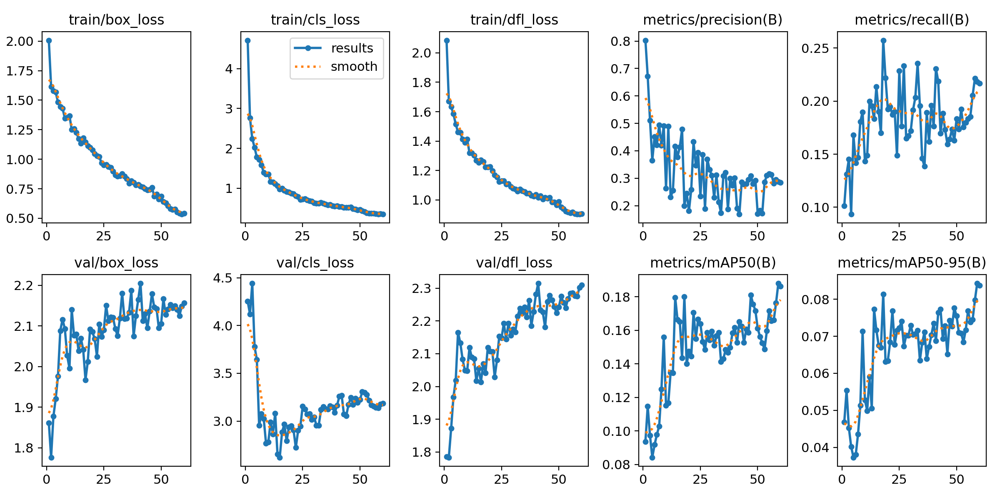

In [17]:
Image ("/content/runs/detect/train2/results.png", width= 900)

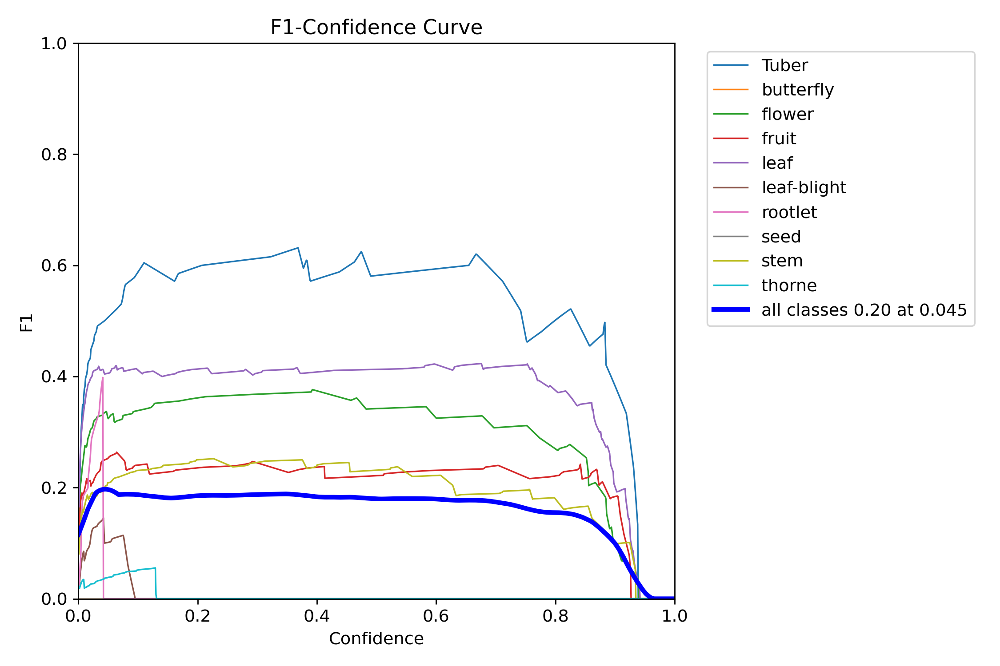

In [18]:
Image ("/content/runs/detect/train2/F1_curve.png", width= 600)

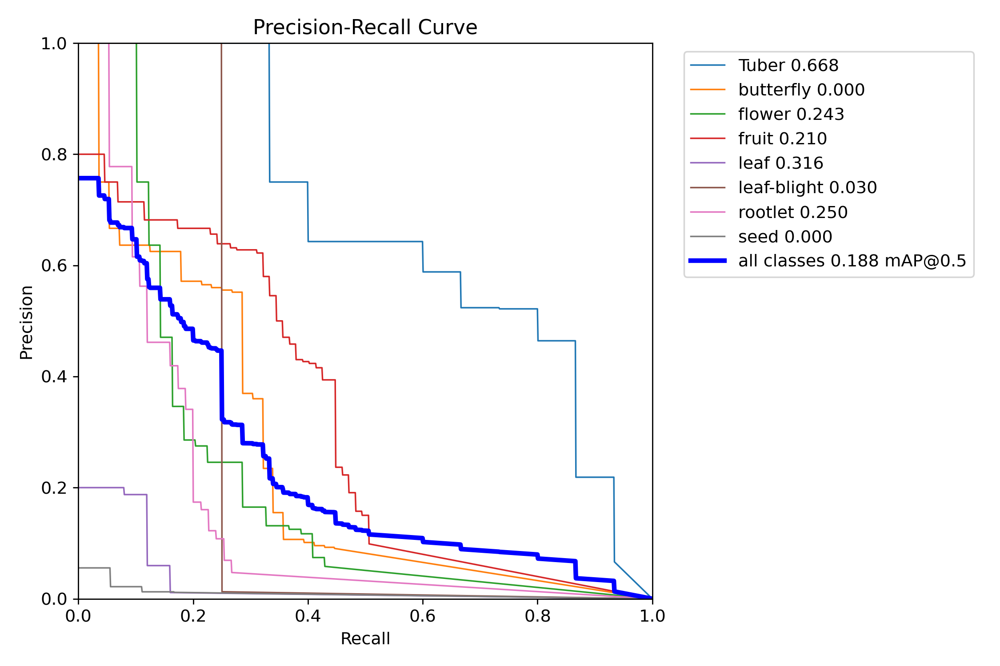

In [19]:
Image ("/content/runs/detect/train2/PR_curve.png", width= 600)

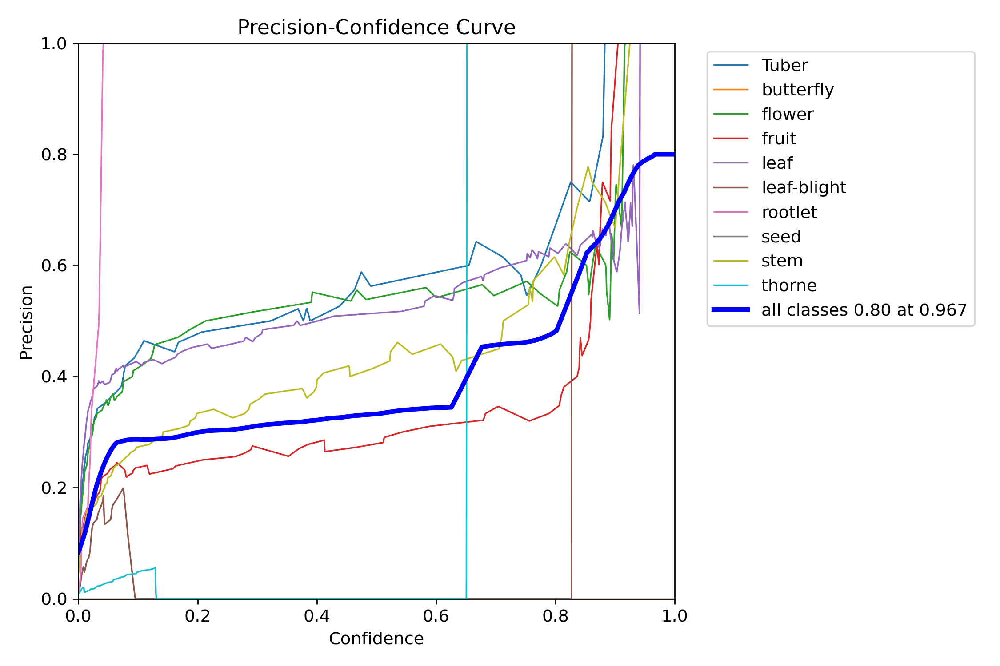

In [20]:
Image ("/content/runs/detect/train2/P_curve.png", width= 600)

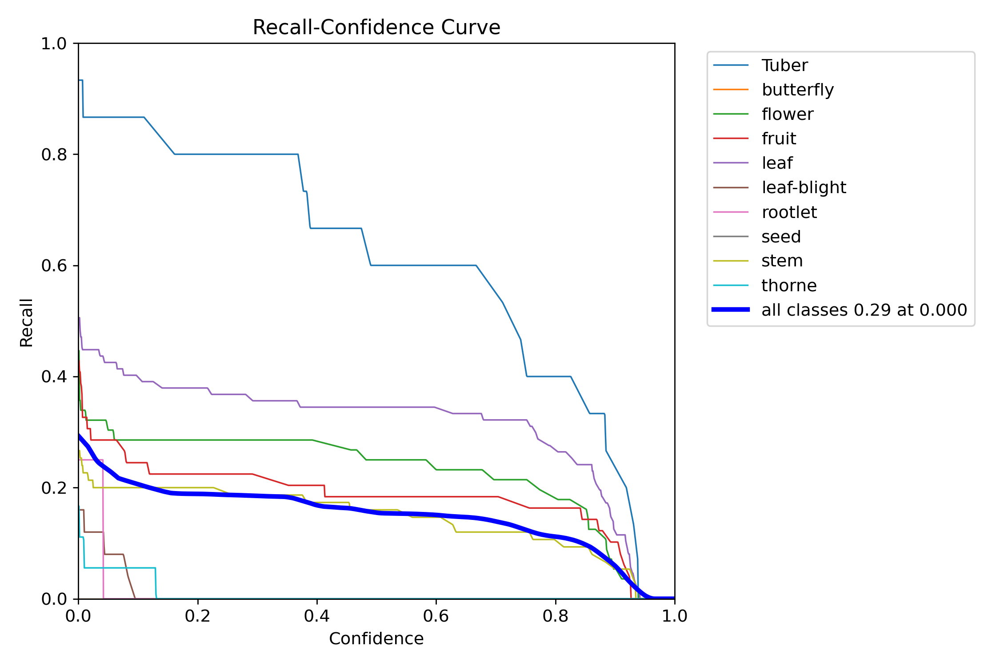

In [21]:
Image ("/content/runs/detect/train2/R_curve.png", width= 600)

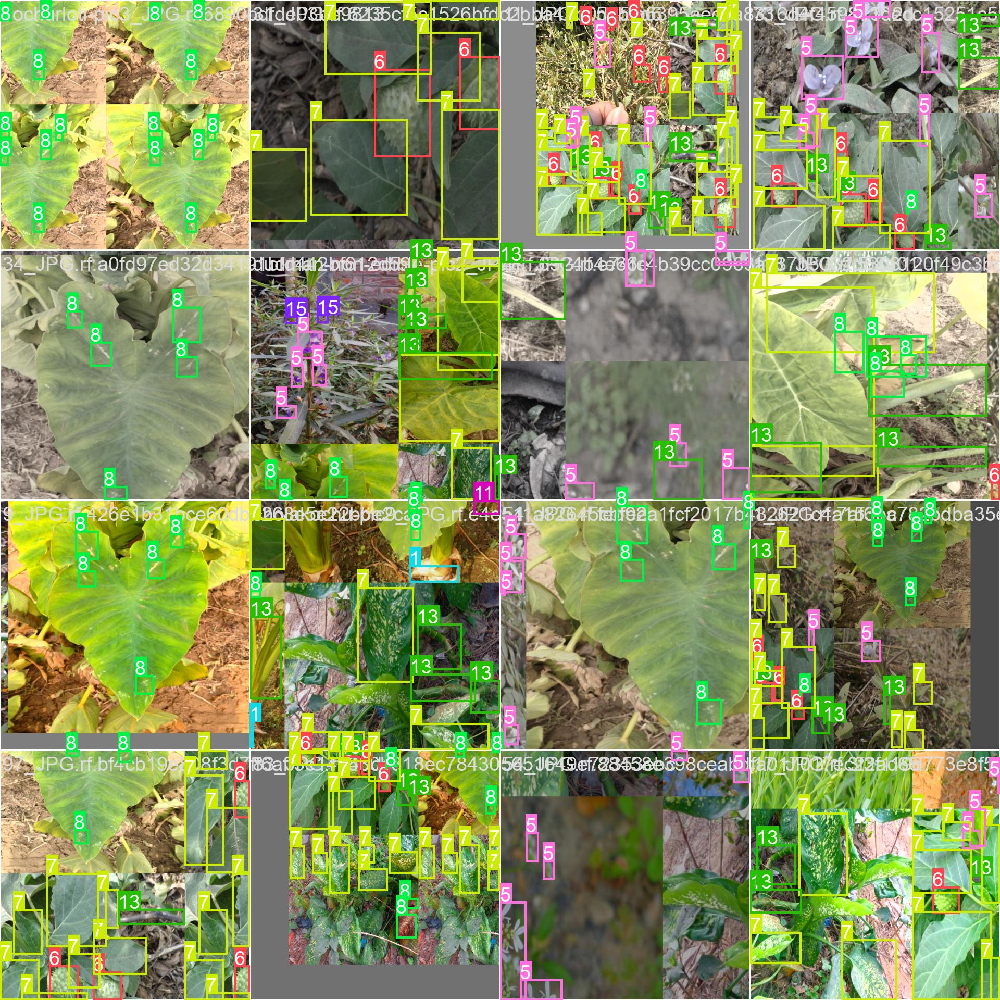

In [22]:
Image ("/content/runs/detect/train2/train_batch0.jpg", width= 900)

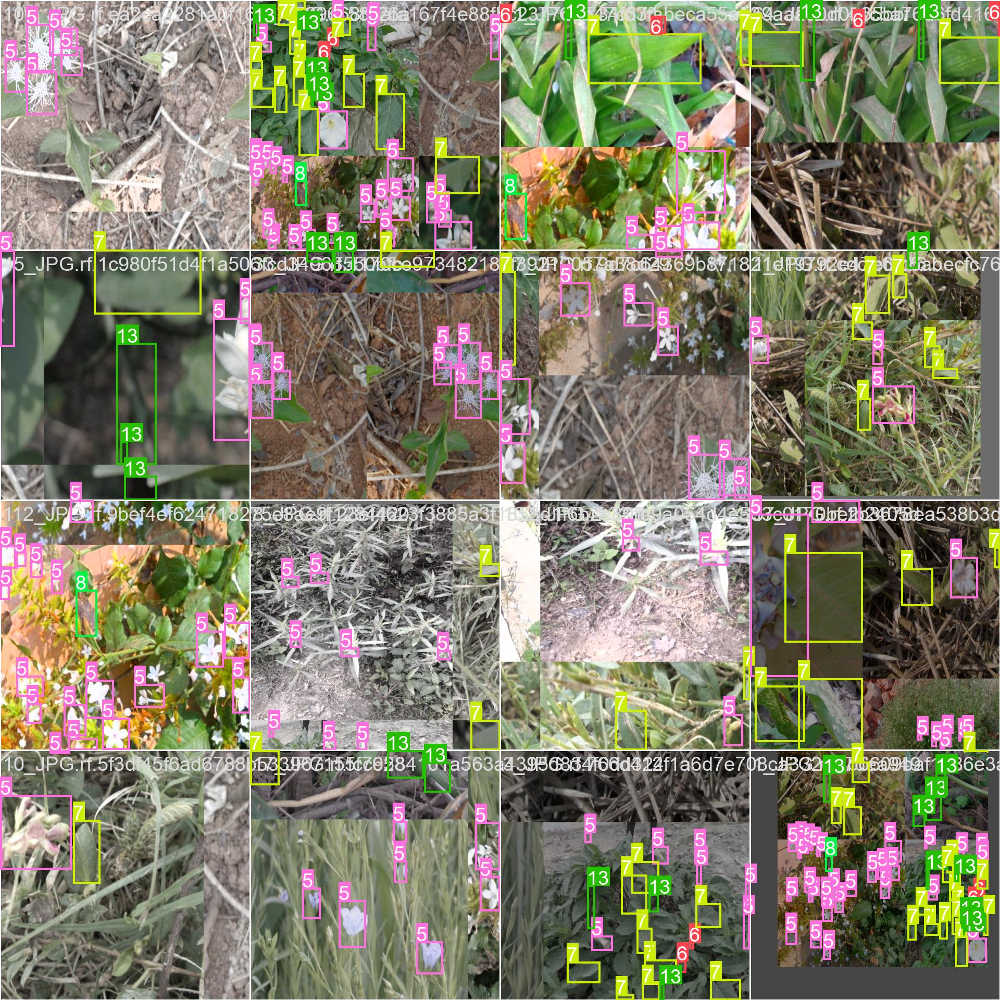

In [23]:
Image ("/content/runs/detect/train2/train_batch1.jpg", width= 900)

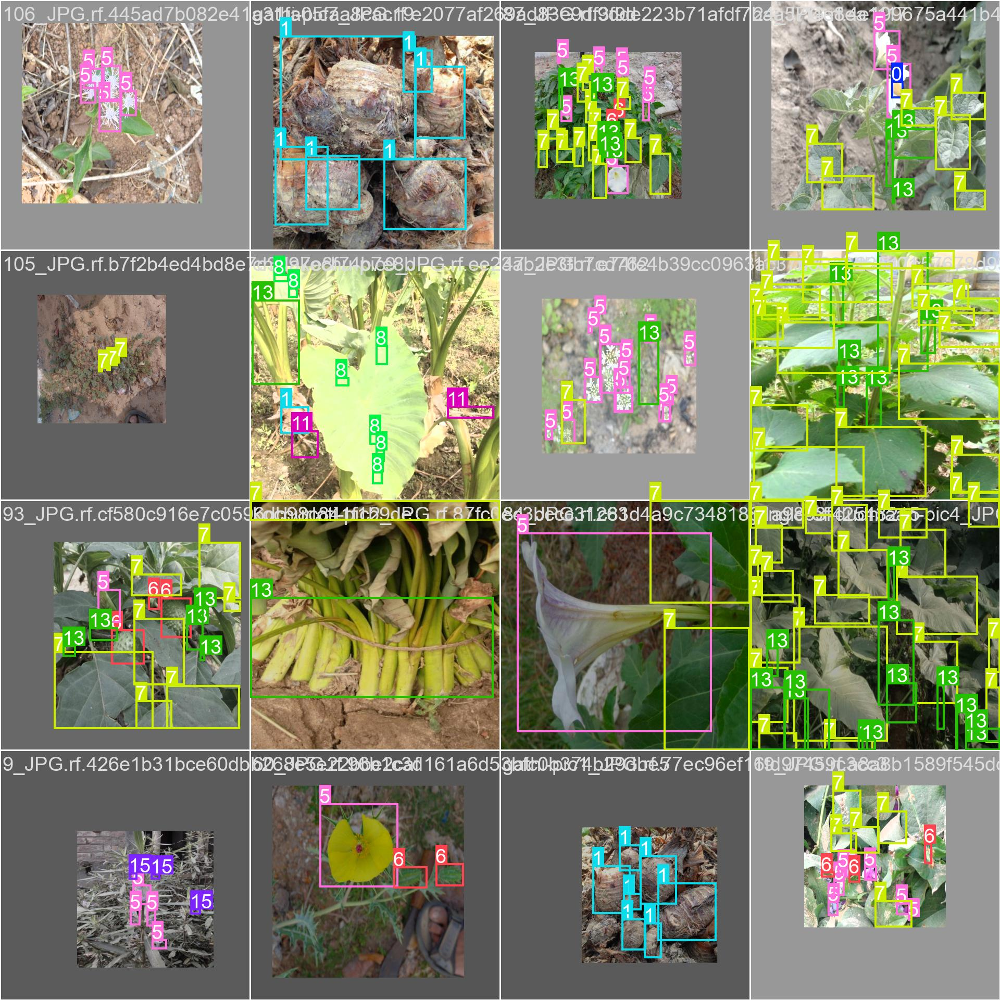

In [25]:
Image ("/content/runs/detect/train2/train_batch1000.jpg", width= 900)

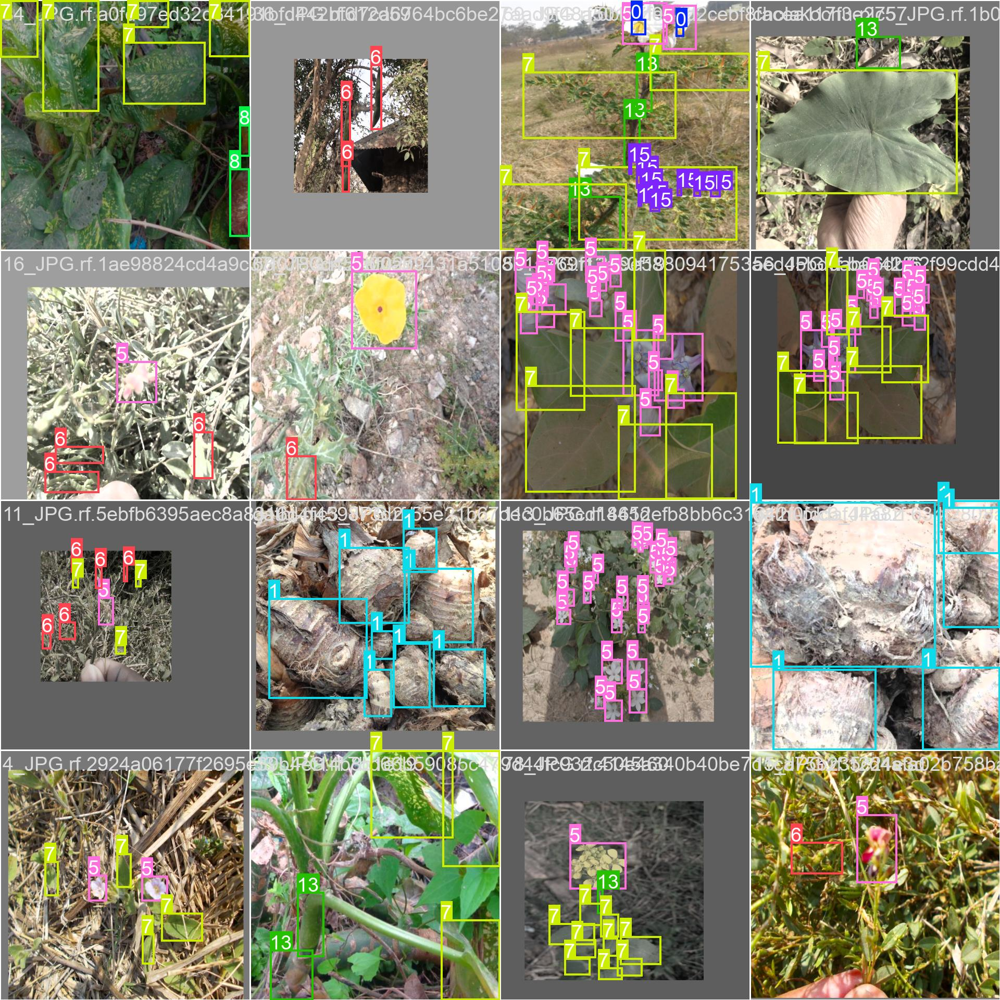

In [26]:
Image ("/content/runs/detect/train2/train_batch1001.jpg", width= 900)

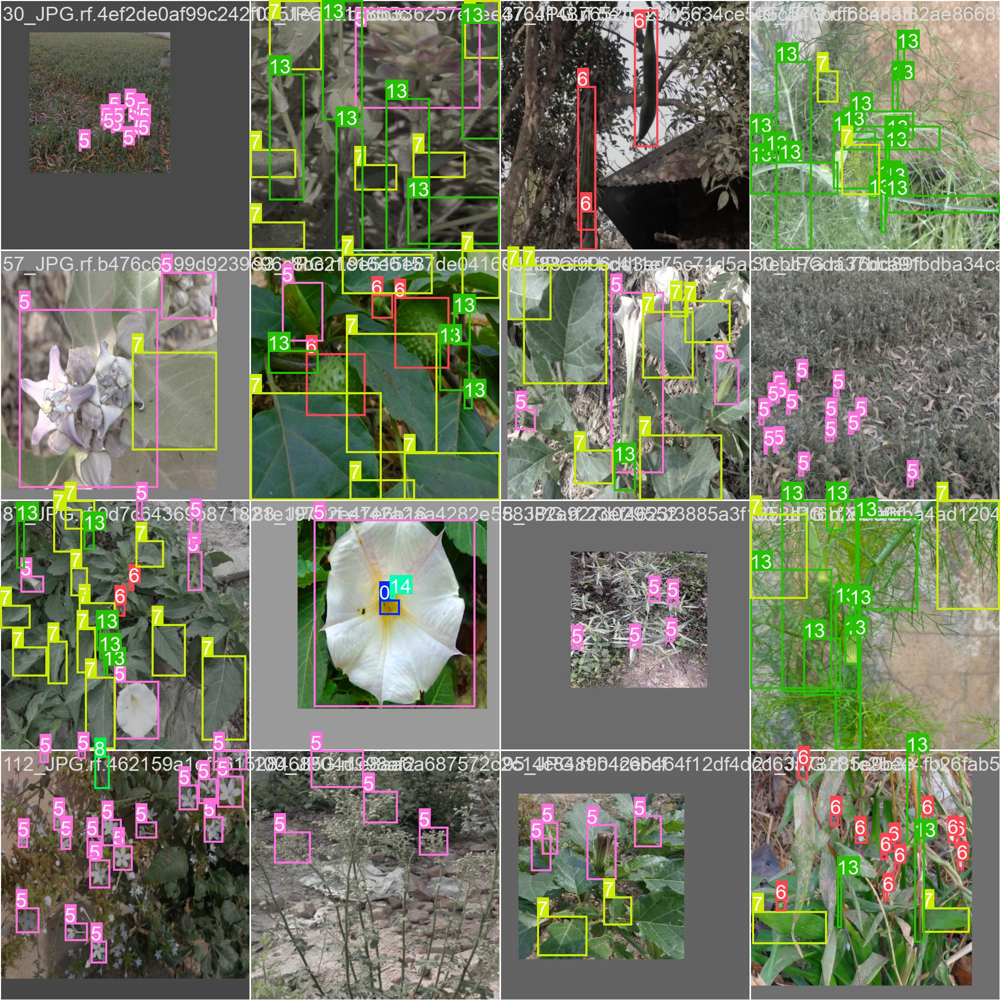

In [27]:
Image ("/content/runs/detect/train2/train_batch1002.jpg", width= 900)

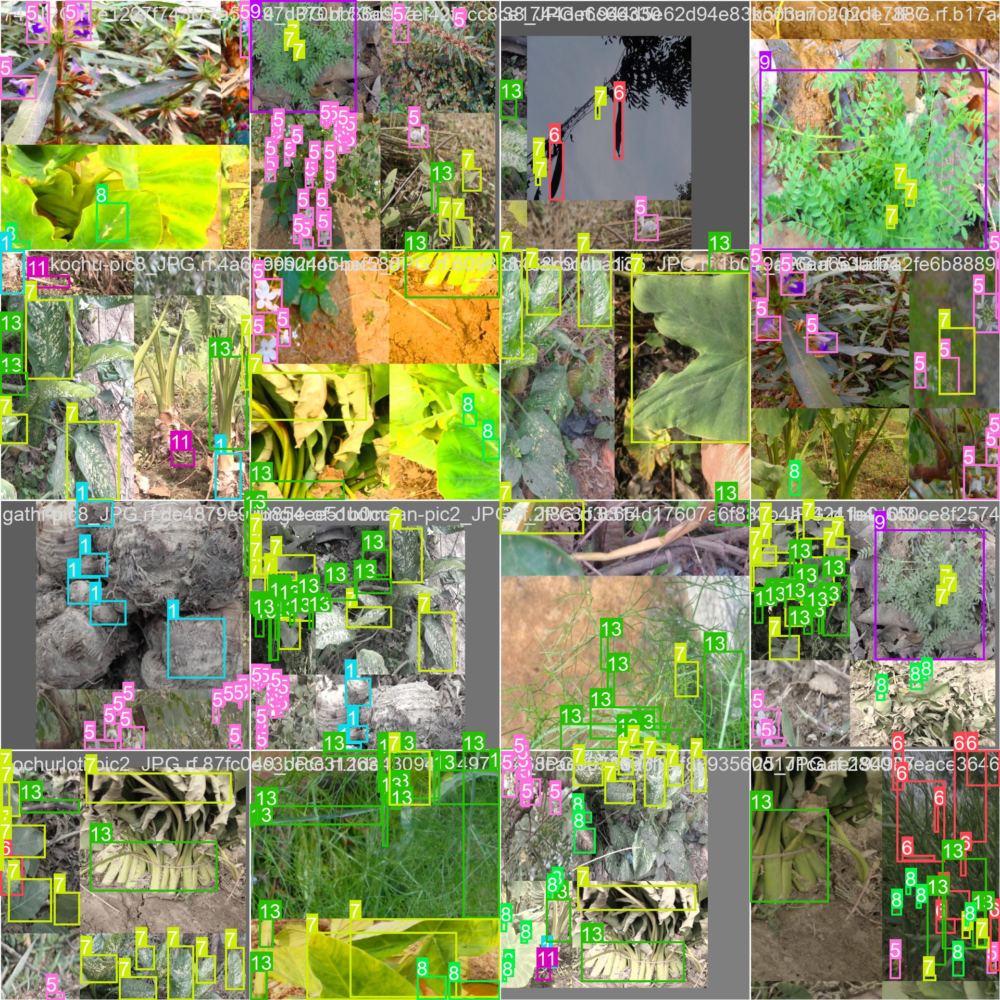

In [28]:
Image ("/content/runs/detect/train2/train_batch2.jpg", width= 900)

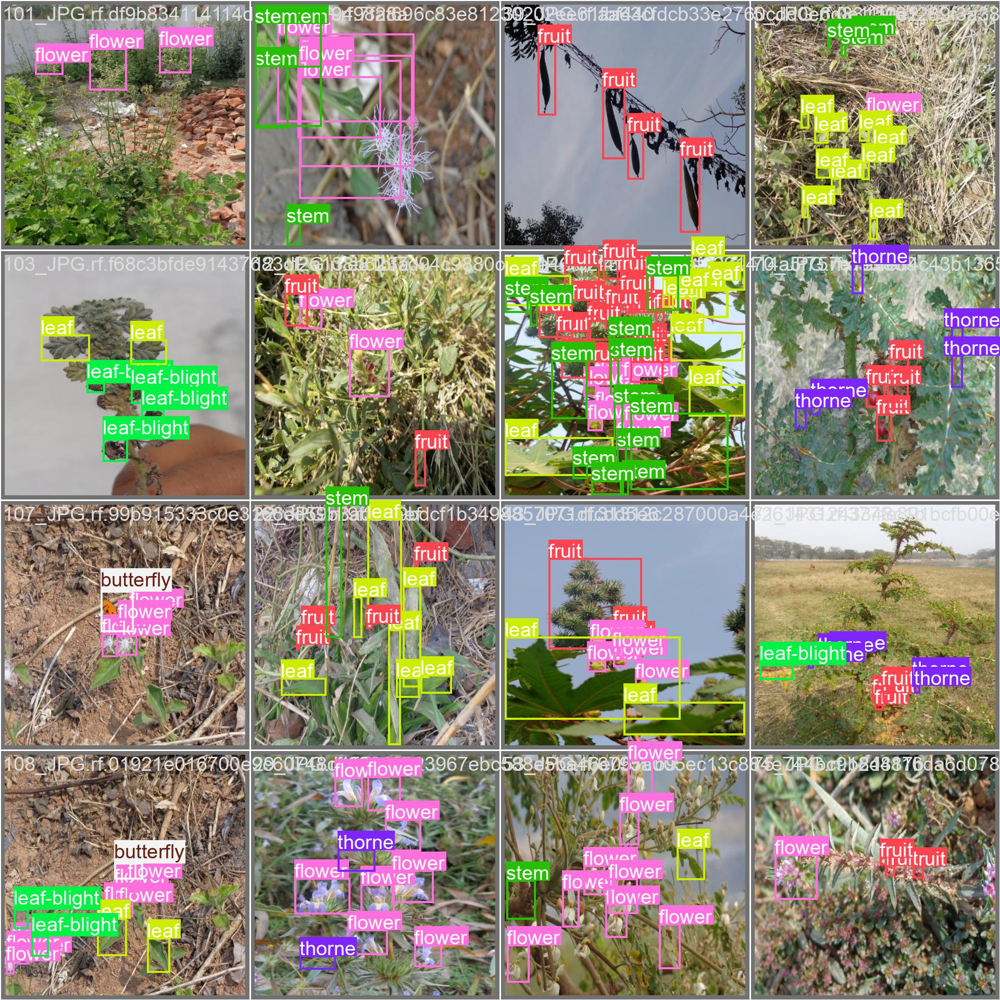

In [30]:
Image ("/content/runs/detect/train2/val_batch0_labels.jpg", width= 900)

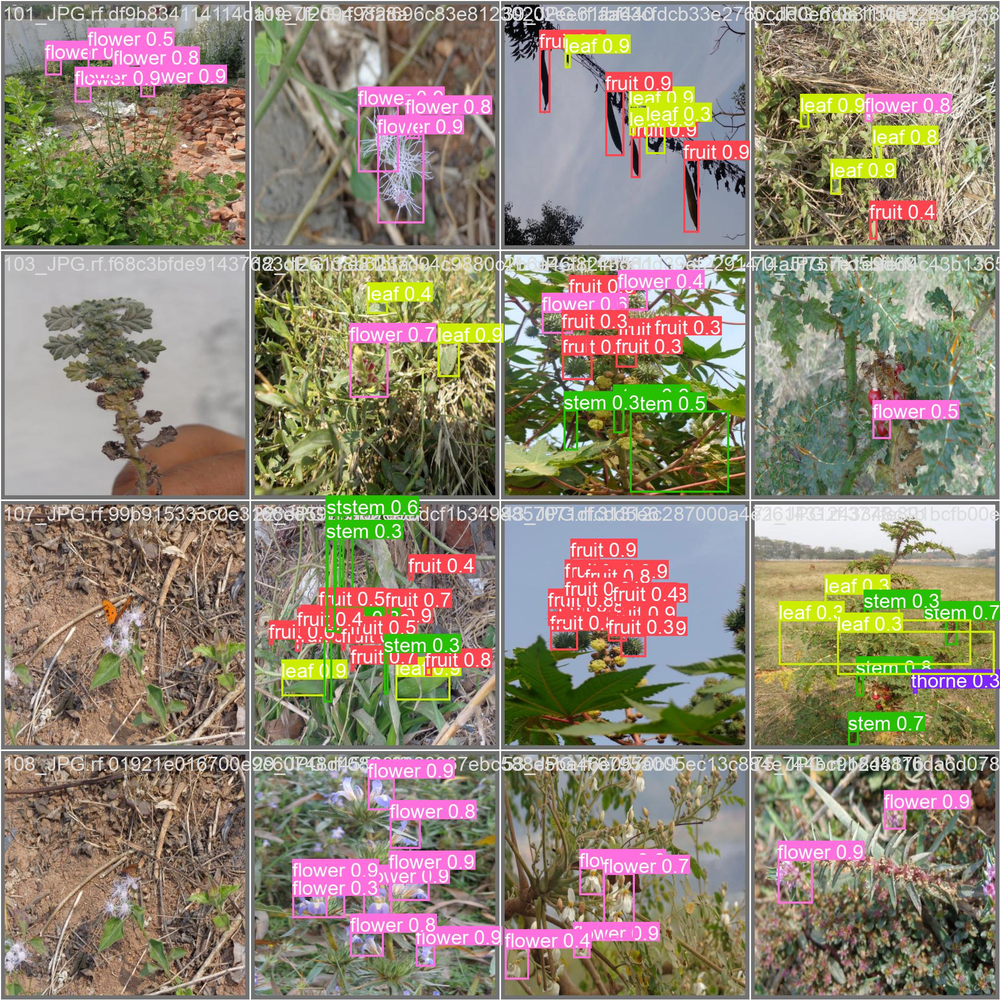

In [31]:
Image ("/content/runs/detect/train2/val_batch0_pred.jpg", width= 900)

In [33]:
! yolo task=detect mode=val model="/content/runs/detect/train2/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,237,459 parameters, 0 gradients, 21.2 GFLOPs
val: Scanning /content/Decoding-Flora-of-Bengal-1/valid/labels.cache... 31 images, 0 backgrounds, 0 corrupt: 100% 31/31 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 187, len(boxes) = 332. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:01<00:00,  1.13it/s]
                   all         31        332      0.287      0.218      0.188     0.0843
                 Tuber          4         15      0.377      0.867      0.668      0.288
             butterfly          2          2          0          0          0          0
                flower         13

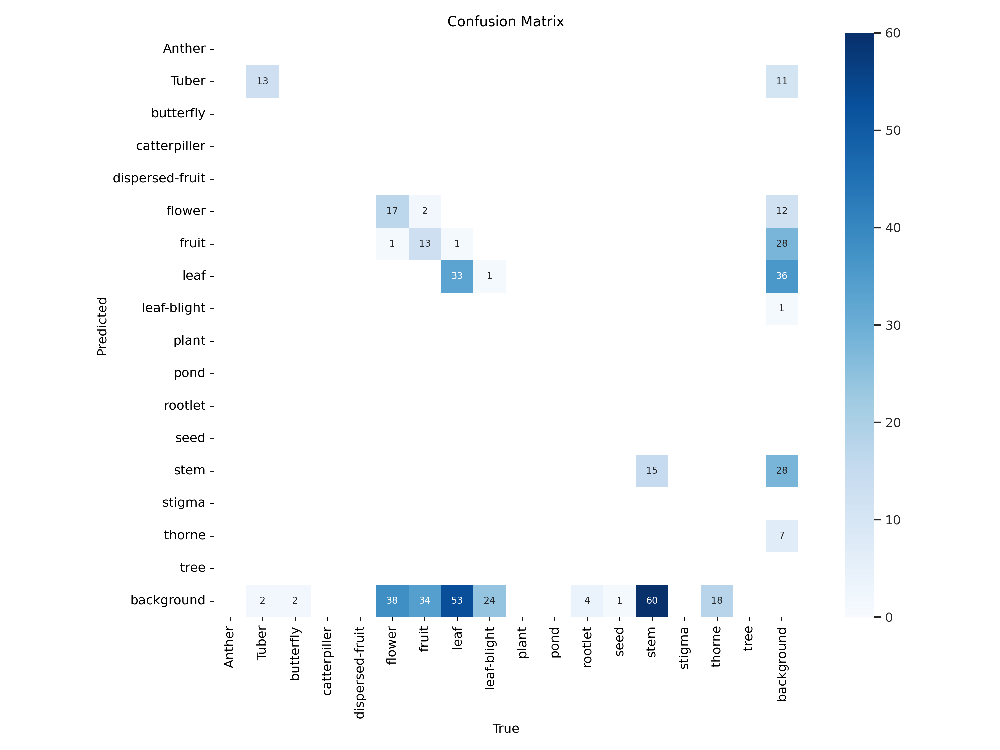

In [34]:
Image ("/content/runs/detect/val2/confusion_matrix.png", width= 900)

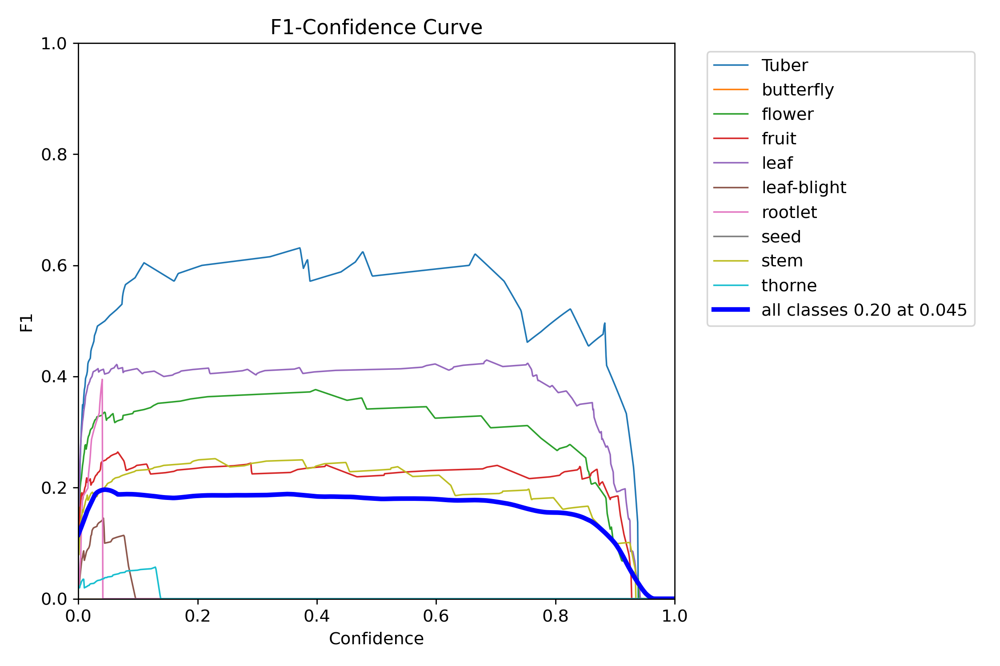

In [35]:
Image ("/content/runs/detect/val2/F1_curve.png", width= 600)

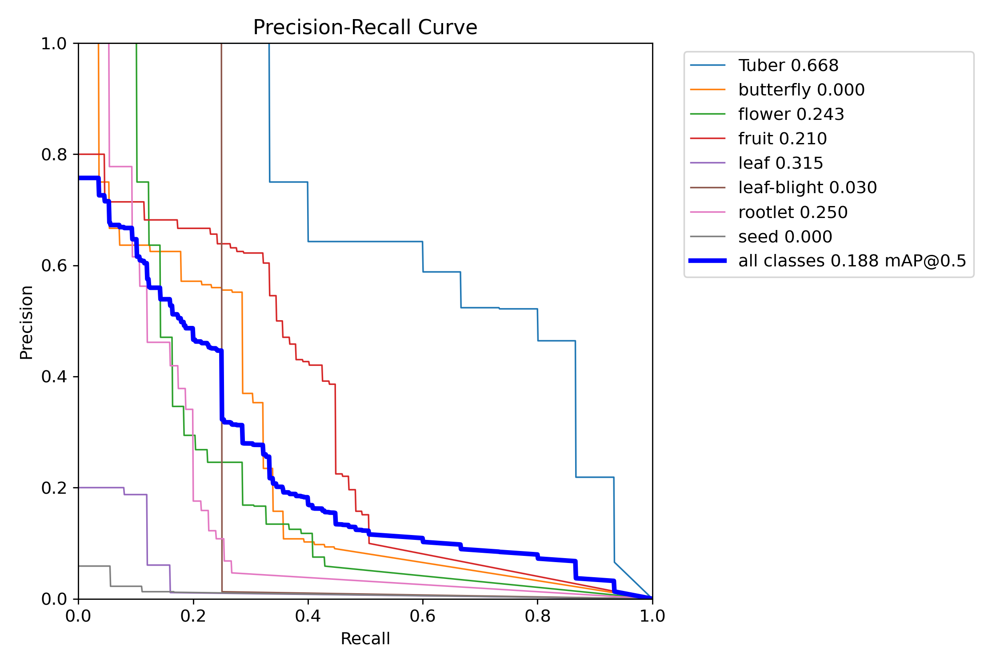

In [36]:
Image ("/content/runs/detect/val2/PR_curve.png", width= 600)

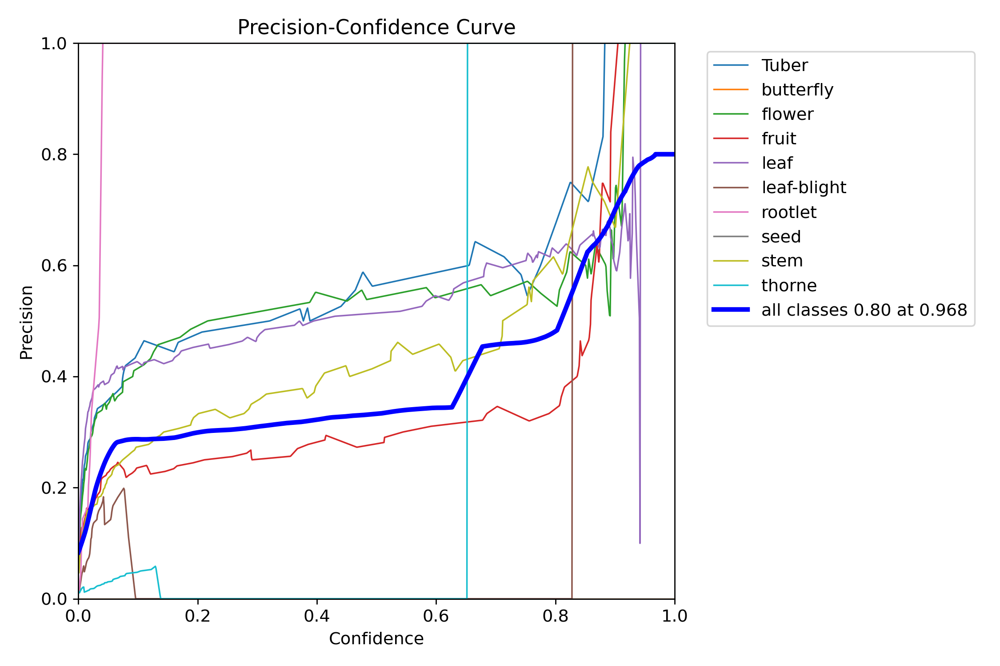

In [37]:
Image ("/content/runs/detect/val2/P_curve.png", width= 600)

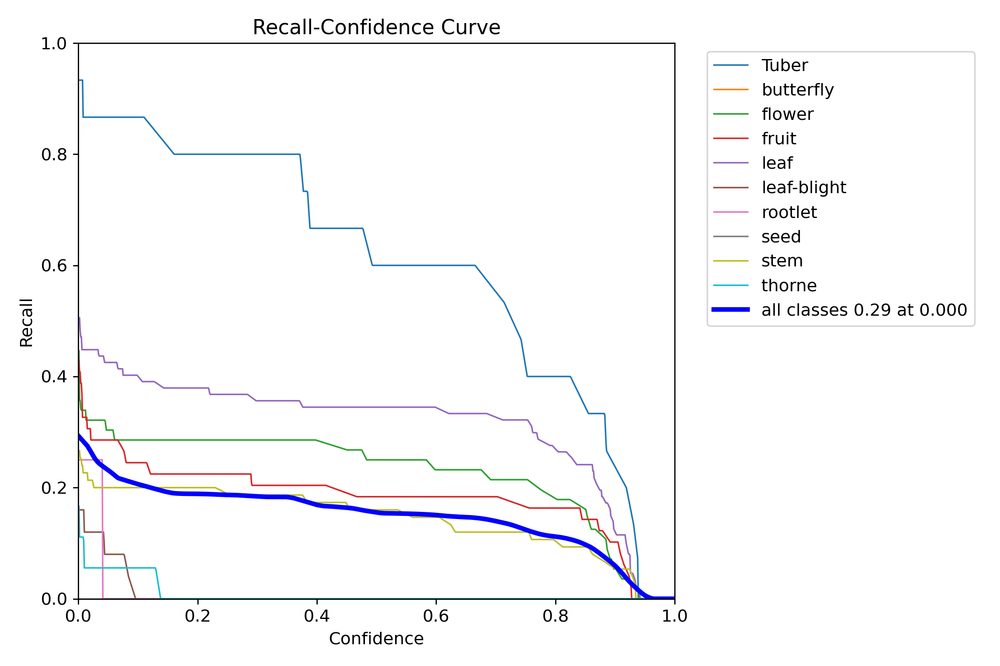

In [38]:
Image ("/content/runs/detect/val2/R_curve.png", width= 600)

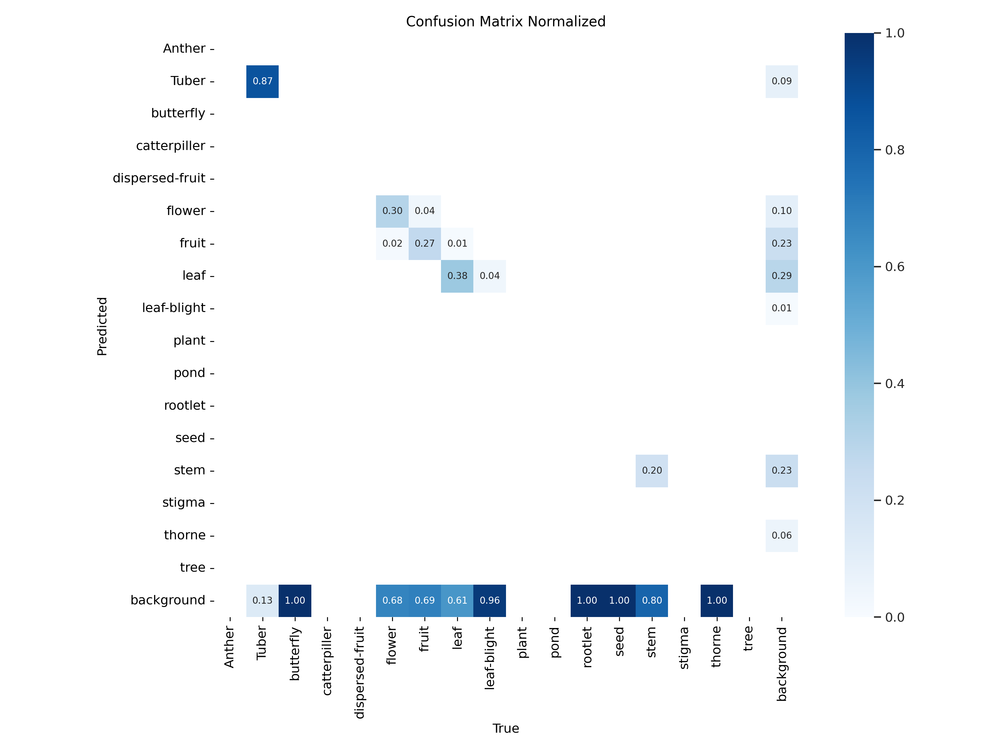

In [39]:
Image ("/content/runs/detect/val2/confusion_matrix_normalized.png", width= 900)

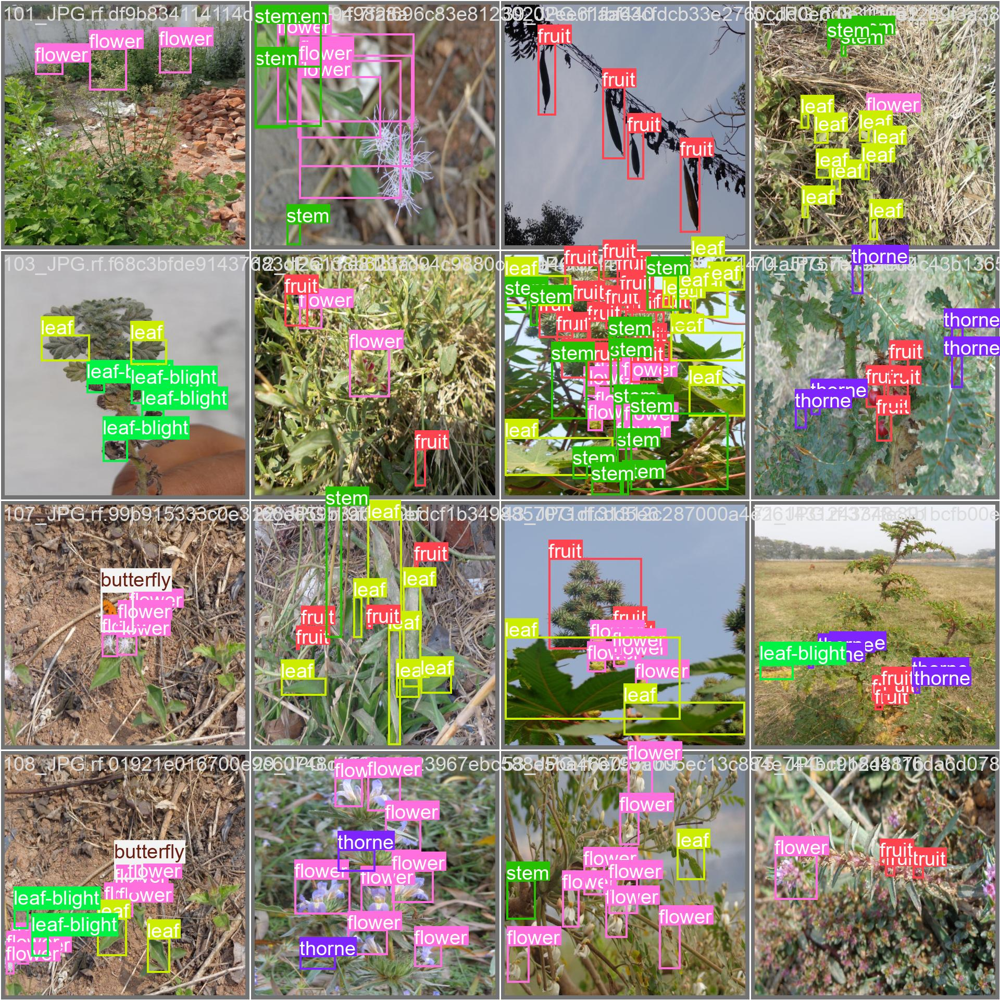

In [40]:
Image ("/content/runs/detect/val2/val_batch0_labels.jpg", width= 900)

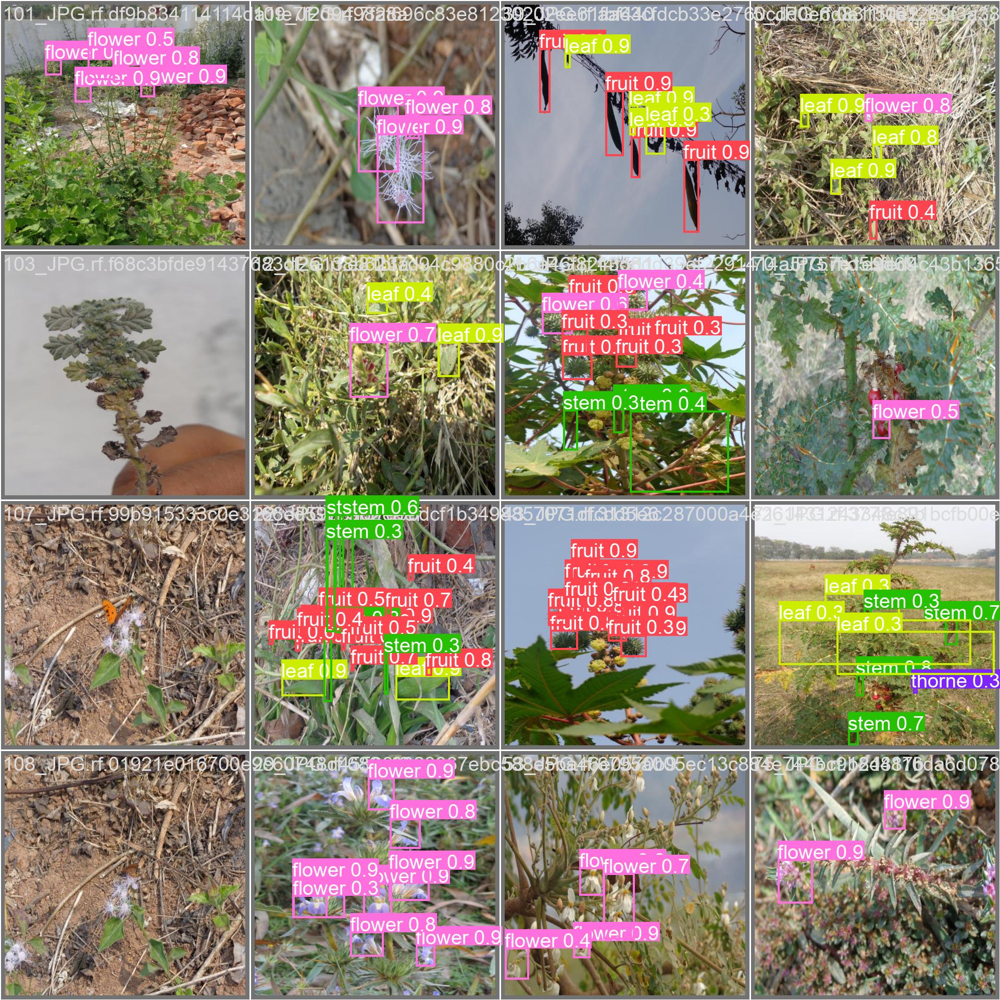

In [41]:
Image ("/content/runs/detect/val2/val_batch0_pred.jpg", width= 900)

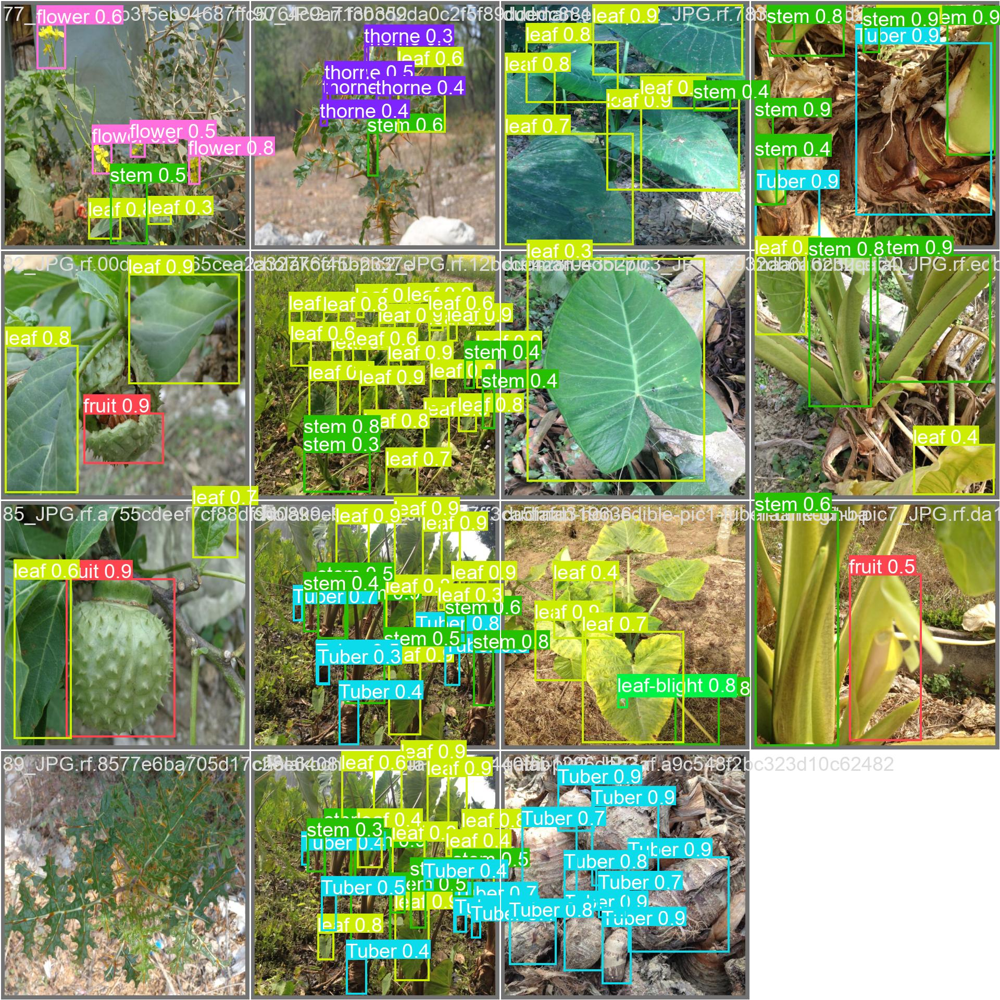

In [42]:
Image ("/content/runs/detect/val2/val_batch1_pred.jpg", width= 900)

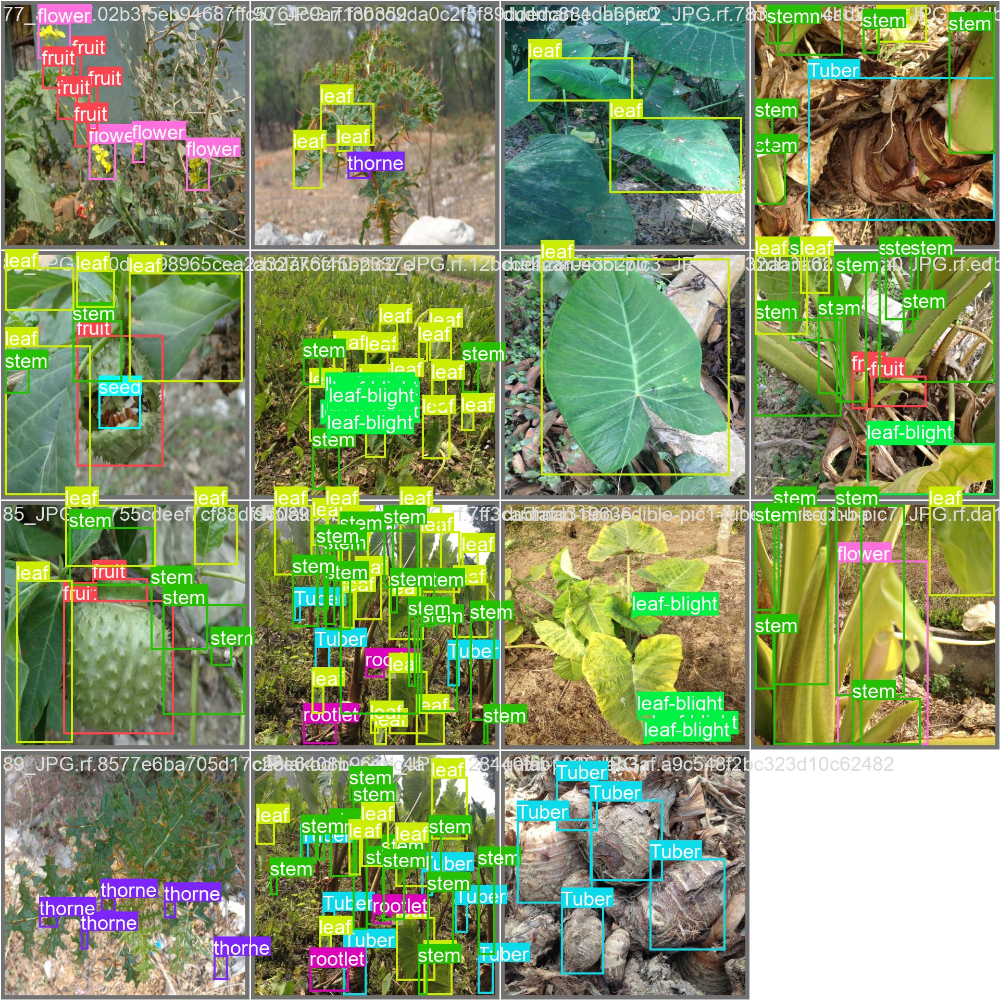

In [43]:
Image ("/content/runs/detect/val2/val_batch1_labels.jpg", width= 900)

In [44]:
! yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,237,459 parameters, 0 gradients, 21.2 GFLOPs

image 1/15 /content/Decoding-Flora-of-Bengal-1/test/images/14_JPG.rf.49eed79c77c3c18f2b72b6ecc1570992.jpg: 800x800 1 flower, 1 fruit, 29.5ms
image 2/15 /content/Decoding-Flora-of-Bengal-1/test/images/20_JPG.rf.d666de6334f806809cdc51682a92f520.jpg: 800x800 6 flowers, 4 fruits, 9 leafs, 29.6ms
image 3/15 /content/Decoding-Flora-of-Bengal-1/test/images/27_JPG.rf.d736bd0ceb6999ae28f0ec603c23c3d2.jpg: 800x800 3 flowers, 2 thornes, 29.5ms
image 4/15 /content/Decoding-Flora-of-Bengal-1/test/images/40_JPG.rf.5be2afa265009404aa4e24e97613fef1.jpg: 800x800 4 fruits, 1 leaf, 29.5ms
image 5/15 /content/Decoding-Flora-of-Bengal-1/test/images/42_JPG.rf.169c073636f1f2c5f1710ecb62646ebc.jpg: 800x800 26 fruits, 29.5ms
image 6/15 /content/Decoding-Flora-of-Bengal-1/test/images/55_JPG.rf.62b3c2b4015c1c75a03f8f105039115b.jpg: 800x800 4 flowe

In [45]:
! yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,237,459 parameters, 0 gradients, 21.2 GFLOPs

image 1/15 /content/Decoding-Flora-of-Bengal-1/test/images/14_JPG.rf.49eed79c77c3c18f2b72b6ecc1570992.jpg: 800x800 1 flower, 1 fruit, 29.5ms
image 2/15 /content/Decoding-Flora-of-Bengal-1/test/images/20_JPG.rf.d666de6334f806809cdc51682a92f520.jpg: 800x800 6 flowers, 4 fruits, 9 leafs, 29.5ms
image 3/15 /content/Decoding-Flora-of-Bengal-1/test/images/27_JPG.rf.d736bd0ceb6999ae28f0ec603c23c3d2.jpg: 800x800 3 flowers, 2 thornes, 29.5ms
image 4/15 /content/Decoding-Flora-of-Bengal-1/test/images/40_JPG.rf.5be2afa265009404aa4e24e97613fef1.jpg: 800x800 4 fruits, 1 leaf, 29.5ms
image 5/15 /content/Decoding-Flora-of-Bengal-1/test/images/42_JPG.rf.169c073636f1f2c5f1710ecb62646ebc.jpg: 800x800 26 fruits, 29.5ms
image 6/15 /content/Decoding-Flora-of-Bengal-1/test/images/55_JPG.rf.62b3c2b4015c1c75a03f8f105039115b.jpg: 800x800 4 flowe

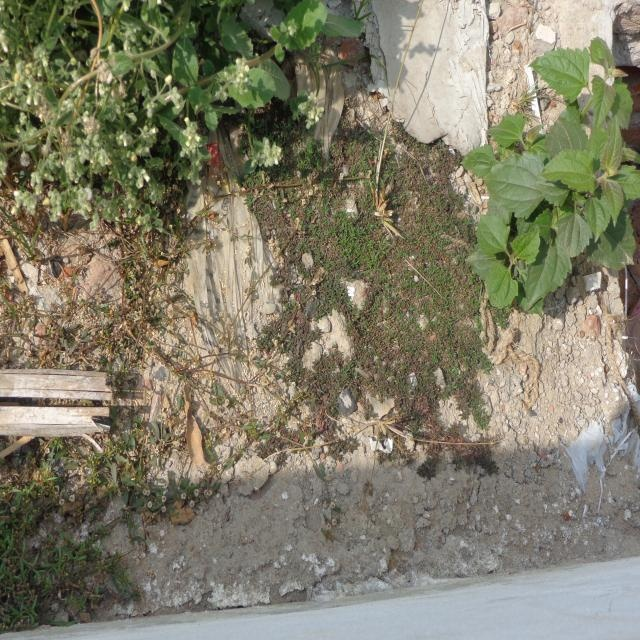

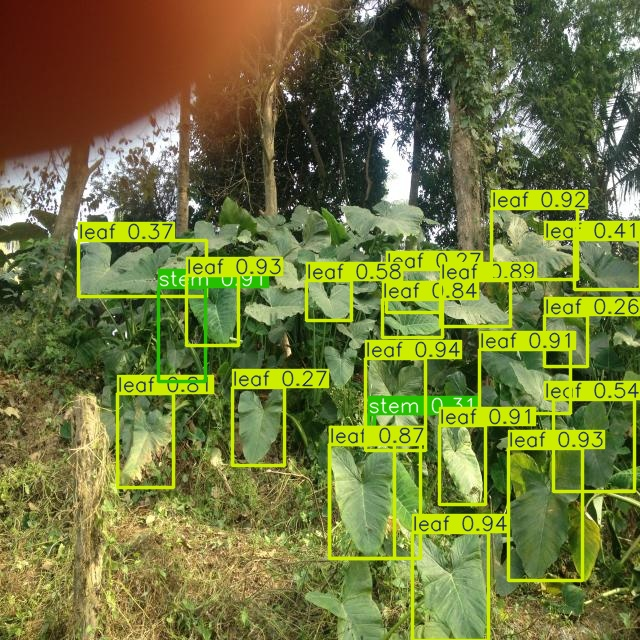

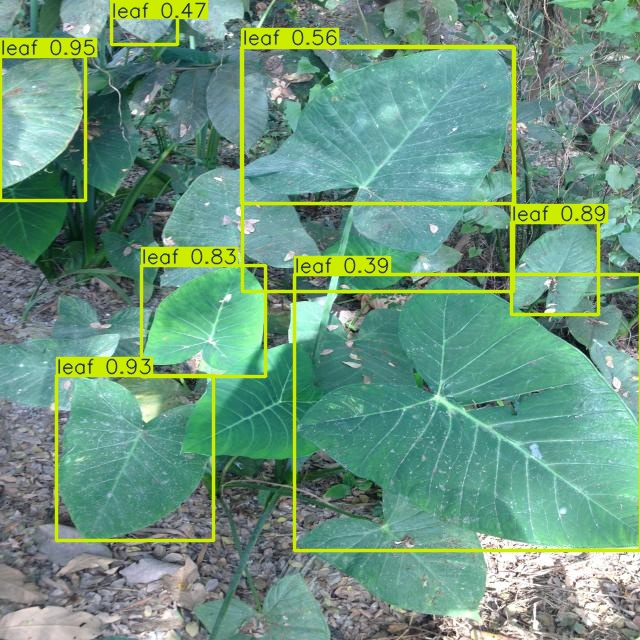

In [46]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
  display(IPyImage(filename=img, width=600))
  print("\n")

In [47]:
! yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source=/content/Decoding-Flora-of-Bengal-1/test/images/14_JPG.rf.49eed79c77c3c18f2b72b6ecc1570992.jpg save=True

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,237,459 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/Decoding-Flora-of-Bengal-1/test/images/14_JPG.rf.49eed79c77c3c18f2b72b6ecc1570992.jpg: 800x800 1 flower, 1 fruit, 29.5ms
Speed: 8.0ms preprocess, 29.5ms inference, 148.4ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


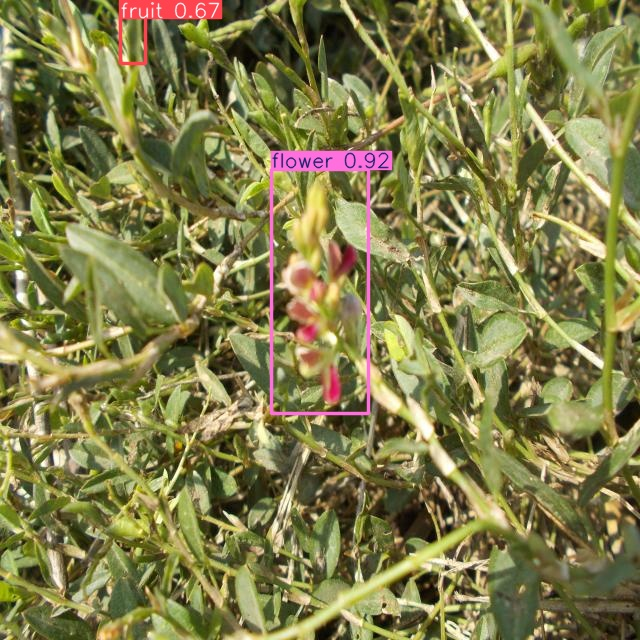

In [49]:
Image ("/content/runs/detect/predict3/14_JPG.rf.49eed79c77c3c18f2b72b6ecc1570992.jpg", width= 1200)

In [50]:
! yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source=/content/Decoding-Flora-of-Bengal-1/test/images/20_JPG.rf.d666de6334f806809cdc51682a92f520.jpg save=True

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,237,459 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/Decoding-Flora-of-Bengal-1/test/images/20_JPG.rf.d666de6334f806809cdc51682a92f520.jpg: 800x800 6 flowers, 4 fruits, 9 leafs, 29.5ms
Speed: 8.4ms preprocess, 29.5ms inference, 149.5ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


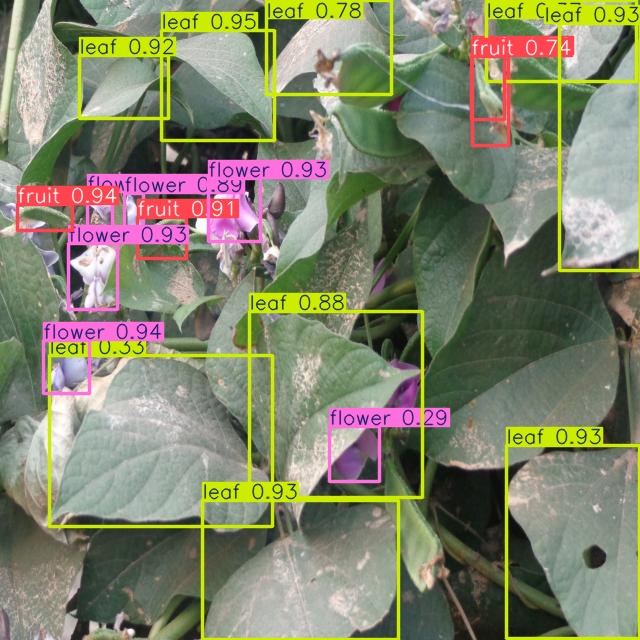

In [51]:
Image ("/content/runs/detect/predict4/20_JPG.rf.d666de6334f806809cdc51682a92f520.jpg", width= 1200)

In [52]:
! yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source=/content/Decoding-Flora-of-Bengal-1/test/images/27_JPG.rf.d736bd0ceb6999ae28f0ec603c23c3d2.jpg save=True

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,237,459 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/Decoding-Flora-of-Bengal-1/test/images/27_JPG.rf.d736bd0ceb6999ae28f0ec603c23c3d2.jpg: 800x800 3 flowers, 2 thornes, 31.7ms
Speed: 13.0ms preprocess, 31.7ms inference, 225.9ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


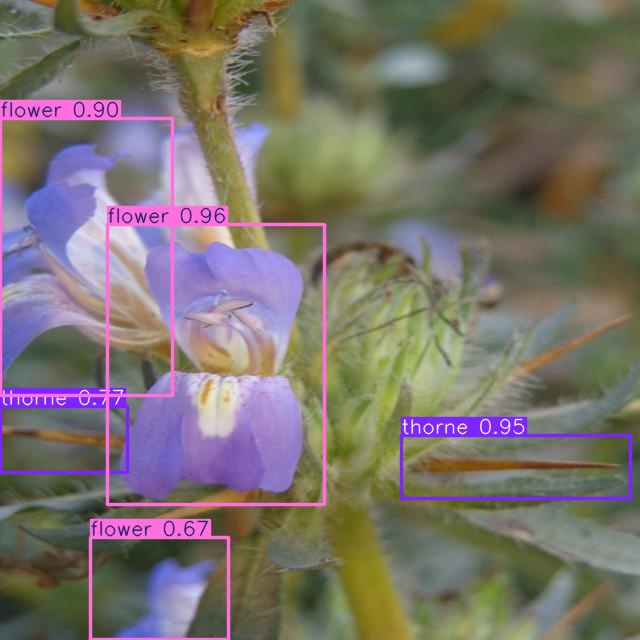

In [53]:
Image ("/content/runs/detect/predict5/27_JPG.rf.d736bd0ceb6999ae28f0ec603c23c3d2.jpg", width= 1200)

In [54]:
! yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source=/content/Decoding-Flora-of-Bengal-1/test/images/40_JPG.rf.5be2afa265009404aa4e24e97613fef1.jpg save=True

Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,237,459 parameters, 0 gradients, 21.2 GFLOPs

image 1/1 /content/Decoding-Flora-of-Bengal-1/test/images/40_JPG.rf.5be2afa265009404aa4e24e97613fef1.jpg: 800x800 4 fruits, 1 leaf, 29.6ms
Speed: 12.7ms preprocess, 29.6ms inference, 231.3ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


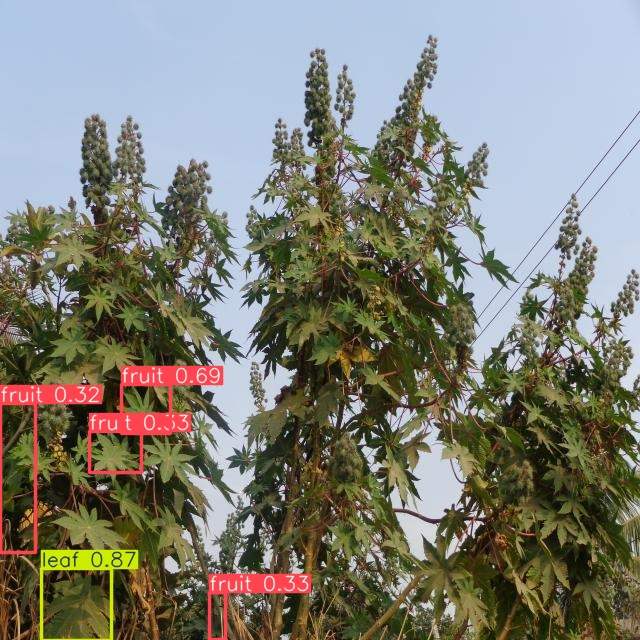

In [55]:
Image ("/content/runs/detect/predict6/40_JPG.rf.5be2afa265009404aa4e24e97613fef1.jpg", width= 1200)

In [56]:
! yolo task=segment mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

WARNING ⚠️ conflicting 'task=segment' passed with 'task=detect' model. Ignoring 'task=segment' and updating to 'task=detect' to match model.
Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 159 layers, 9,237,459 parameters, 0 gradients, 21.2 GFLOPs

image 1/15 /content/Decoding-Flora-of-Bengal-1/test/images/14_JPG.rf.49eed79c77c3c18f2b72b6ecc1570992.jpg: 800x800 1 flower, 1 fruit, 29.5ms
image 2/15 /content/Decoding-Flora-of-Bengal-1/test/images/20_JPG.rf.d666de6334f806809cdc51682a92f520.jpg: 800x800 6 flowers, 4 fruits, 9 leafs, 29.7ms
image 3/15 /content/Decoding-Flora-of-Bengal-1/test/images/27_JPG.rf.d736bd0ceb6999ae28f0ec603c23c3d2.jpg: 800x800 3 flowers, 2 thornes, 29.5ms
image 4/15 /content/Decoding-Flora-of-Bengal-1/test/images/40_JPG.rf.5be2afa265009404aa4e24e97613fef1.jpg: 800x800 4 fruits, 1 leaf, 29.5ms
image 5/15 /content/Decoding-Flora-of-Bengal-1/test/images/42_JPG.rf.169c073636f1f2c5f1710ecb62646ebc.jpg: 800x800

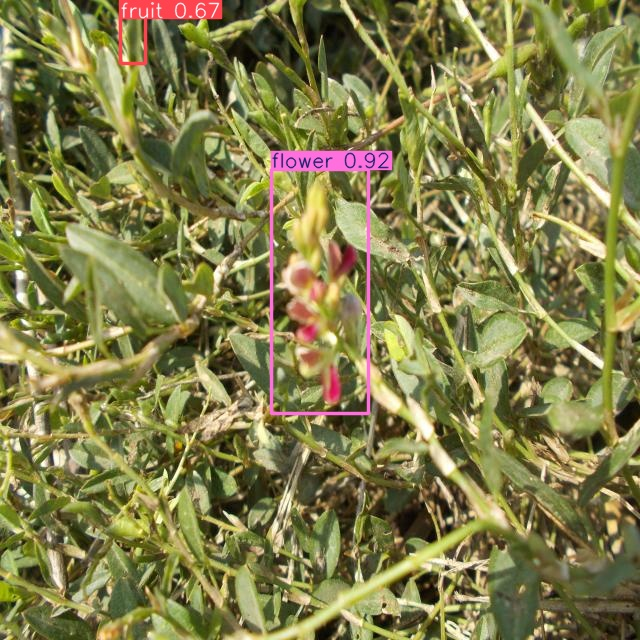

In [57]:
Image ("/content/runs/detect/predict7/14_JPG.rf.49eed79c77c3c18f2b72b6ecc1570992.jpg", width= 1200)

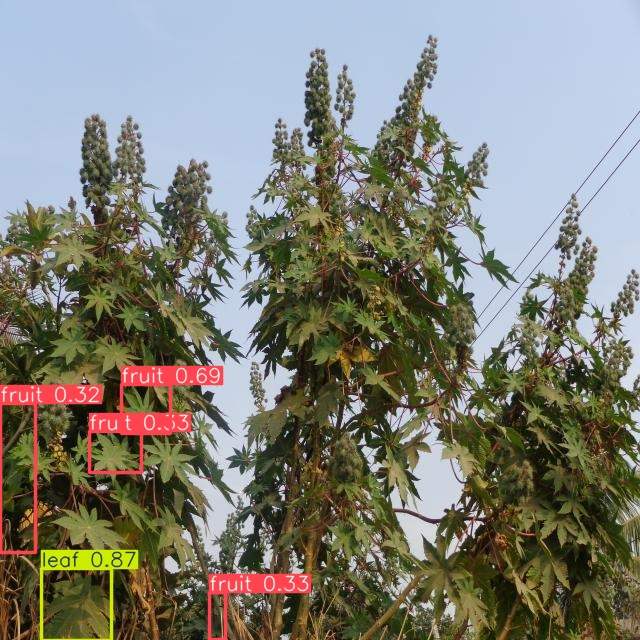

In [58]:
Image ("/content/runs/detect/predict7/40_JPG.rf.5be2afa265009404aa4e24e97613fef1.jpg", width= 1200)